# ĐỒ ÁN DATAVISUAL

**Nhập các thư viện cần dùng**

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import bokeh.plotting as bp
from scipy import stats 
from bokeh.io import output_notebook, show
from plotly.subplots import make_subplots
import plotly.graph_objects as go


# 1. Tổng quan về bộ dữ liệu

Bộ dữ liệu này cung cấp một bức tranh chi tiết về các tin đăng cho thuê bất động sản tại các thành phố lớn ở Các Tiểu vương quốc Ả Rập Thống nhất (UAE), bao gồm Abu Dhabi, Dubai, Sharjah, Ajman, Ras Al Khaimah, Umm Al Quwain và Al Ain. 

Được thu thập từ trang web bayut.com, bộ dữ liệu chứa nhiều thông tin như loại bất động sản, diện tích, giá thuê và vị trí, tạo nên một nguồn tài nguyên quý giá để phân tích thị trường cho thuê tại UAE. Phù hợp cho các nhà phân tích dữ liệu, nhà nghiên cứu và chuyên gia bất động sản, bộ dữ liệu này cho phép phân tích toàn diện về xu hướng, giá cả và động lực thị trường trong bối cảnh đa dạng của thị trường cho thuê UAE.



**1.1 Đọc bộ dữ liệu**

In [4]:
df = pd.read_csv('Dubai.csv')

**1.2 Kích thước bộ dữ liệu**

In [5]:
df.shape

(73742, 17)

*- Bộ dữ liệu bao gồm 73742 hàng và 16 cột*

**1.3 Truy xuất sơ lược bộ dữ liệu**

5 hàng dữ liệu đầu tiên:

In [6]:
df.head()

,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
0,"The Gate Tower 2, The Gate Tower, Shams Gate D...",124000,3.0,4.0,Apartment,1785,69.467787,Medium,Yearly,Unfurnished,For Rent,07/03/2024,45,Al Reem Island,Abu Dhabi,24.493598,54.407841
1,"Water's Edge, Yas Island, Abu Dhabi",140000,3.0,4.0,Apartment,1422,98.452883,Medium,Yearly,Unfurnished,For Rent,08/03/2024,44,Yas Island,Abu Dhabi,24.494022,54.607372
2,"Al Raha Lofts, Al Raha Beach, Abu Dhabi",99000,2.0,3.0,Apartment,1314,NaN,Medium,Yearly,Furnished,For Rent,21/03/2024,31,Al Raha Beach,Abu Dhabi,24.485931,54.600939
3,"Marina Heights, Marina Square, Al Reem Island,...",220000,NaN,4.0,Penthouse,3843,57.246942,High,Yearly,Unfurnished,For Rent,24/02/2024,57,Al Reem Island,Abu Dhabi,24.493598,54.407841
4,"West Yas, Yas Island, Abu Dhabi",350000,5.0,7.0,Villa,6860,51.020408,High,Yearly,Unfurnished,For Rent,16/02/2024,65,Yas Island,Abu Dhabi,24.494022,54.607372


5 hàng dữ liệu cuối cùng:

In [7]:
df.tail()

,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
73737,"Al Huboob 1, Al Salamah, Umm Al Quwain",14000,0.0,1.0,NaN,419,33.412888,Low,Yearly,Unfurnished,For Rent,14/12/2023,129,Al Salamah,Umm Al Quwain,25.493412,55.575994
73738,"Umm Al Quwain Marina, Umm Al Quwain",14000,0.0,1.0,Apartment,500,NaN,Low,Yearly,Unfurnished,For Rent,14/12/2023,129,Umm Al Quwain Marina,Umm Al Quwain,25.527959,55.606527
73739,"King Faisal Street, Umm Al Quwain",50000,3.0,4.0,Apartment,2000,25.000000,Low,Yearly,Unfurnished,For Rent,02/01/2024,110,King Faisal Street,Umm Al Quwain,NaN,NaN
73740,"Al Maqtaa, Umm Al Quwain",37000,1.0,2.0,Apartment,989,37.411527,Low,Yearly,Unfurnished,For Rent,23/10/2023,181,Al Maqtaa,Umm Al Quwain,NaN,NaN
73741,"Al Rass, Umm Al Quwain",11000,0.0,1.0,Apartment,300,36.666667,Low,Yearly,Unfurnished,For Rent,12/02/2024,69,Al Rass,Umm Al Quwain,NaN,NaN


**1.4 Truy xuất các biến:**

In [8]:
list(df.columns.values)

['Address',
 'Rent',
 'Beds',
 'Baths',
 'Type',
 'Area_in_sqft',
 'Rent_per_sqft',
 'Rent_category',
 'Frequency',
 'Furnishing',
 'Purpose',
 'Posted_date',
 'Age_of_listing_in_days',
 'Location',
 'City',
 'Latitude',
 'Longitude']

Ý nghĩa của từng cột trong bộ dữ liệu:
- Address: Địa chỉ đầy đủ của bất động sản.

- Rent: Giá thuê hàng năm tính bằng AED.

- Beds: Số lượng phòng ngủ trong bất động sản.

- Baths: Số lượng phòng tắm trong bất động sản.

- Type: Loại bất động sản (ví dụ: Căn hộ, Biệt thự, Penthouse).

- Area_in_sqft: Tổng diện tích bất động sản tính bằng feet vuông.

- Rent_per_sqft: Giá thuê trên mỗi feet vuông, được tính bằng cách chia Giá thuê cho Diện tích.

- Rent_category: Phân loại mức giá thuê (Thấp, Trung bình, Cao) dựa trên ngưỡng định sẵn.

- Frequency: Tần suất thanh toán tiền thuê, luôn là 'Hàng năm'.

- Furnishing: Tình trạng nội thất của bất động sản (Có nội thất, Không nội thất).

- Purpose: Mục đích của tin đăng, thường là 'Cho thuê'.

- Posted_date: Ngày bất động sản được đăng cho thuê.

- Age_of_listing_in_days: Số ngày tin đăng đã hoạt động kể từ khi được đăng.

- Location: Vị trí cụ thể trong thành phố nơi bất động sản tọa lạc.

- City: Thành phố nơi bất động sản tọa lạc.

- Latitude, Longitude: Tọa độ địa lý của bất động sản.

**1.5 Kiểm tra kiểu dữ liệu của các cột**

In [9]:
print("Kiểu dữ liệu của các cột trong bộ dữ liệu là: ")
print(df.dtypes)

Kiểu dữ liệu của các cột trong bộ dữ liệu là: 
Address                    object
Rent                        int64
Beds                      float64
Baths                     float64
Type                       object
Area_in_sqft                int64
Rent_per_sqft             float64
Rent_category              object
Frequency                  object
Furnishing                 object
Purpose                    object
Posted_date                object
Age_of_listing_in_days      int64
Location                   object
City                       object
Latitude                  float64
Longitude                 float64
dtype: object


- Các cột mang dữ liệu định tính là: Address, Type, Rent_category, Frequency, Furnishing, Purpose, Posted_date, Location, City

- Các cột mang dữ liệu định lượng là: Rent, Beds, Baths, Area_in_sqft, Rent_per_sqft, Age_of_listing_in_days, Latitude, Longitude

**1.6 Kiểm tra sự trùng lặp trong bộ dữ liệu**

In [10]:
duplicates = df.duplicated()
print('Số dữ liệu bị trùng là:', duplicates.sum())

Số dữ liệu bị trùng là: 0


**1.7 Sử dụng Hàm Mô tả để khám phá Thống kê theo Kiểu Dữ liệu Số:**

In [11]:
df.describe()

,Rent,Beds,Baths,Area_in_sqft,Rent_per_sqft,Age_of_listing_in_days,Latitude,Longitude
count,7.374200e+04,72973.000000,73050.000000,73742.000000,66588.000000,73742.000000,73023.000000,73023.000000
mean,1.479250e+05,2.164294,2.649459,2054.053552,88.113898,74.261547,24.918929,55.053133
std,3.069658e+05,1.578846,1.632035,3003.919252,66.470869,72.346767,0.569356,0.653722
min,0.000000e+00,0.000000,1.000000,74.000000,0.000000,11.000000,15.175847,43.351928
25%,5.499900e+04,1.000000,2.000000,850.000000,39.988810,30.000000,24.493598,54.607372
50%,9.800000e+04,2.000000,2.000000,1334.000000,71.428571,52.000000,25.078641,55.238209
75%,1.700000e+05,3.000000,3.000000,2130.000000,118.518518,95.000000,25.197978,55.367138
max,5.500000e+07,12.000000,11.000000,210254.000000,2182.044888,2276.000000,25.920310,56.361294


- Giá thuê dao động từ 0 đến hơn 55000000 AED với mức giá trung bình khoảng 147925 AED. 

- Số lượng phòng ngủ (Beds) dao động từ 0 đến 12 phòng với số phòng trung bình khoảng 2,16 phòng.  

- Số lượng phòng tắm (Baths) dao động từ 0 đến 11 phòng với số phòng trung bình khoảng 2,65 phòng. 

- Diện tích của bất động sản (Area_in_sqft) dao động từ 74 ft vuông đến hơn 3003 ft vuông với diện tích trung bình là khoảng 2054 ft vuông. 

- Số ngày niêm yết tính trung bình là khoảng 74 ngày.

**1.8 Kiểm tra dữ liệu NaN của các cột:**

In [12]:
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73742 entries, 0 to 73741
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Address                 73742 non-null  object 
 1   Rent                    73742 non-null  int64  
 2   Beds                    72973 non-null  float64
 3   Baths                   73050 non-null  float64
 4   Type                    65697 non-null  object 
 5   Area_in_sqft            73742 non-null  int64  
 6   Rent_per_sqft           66588 non-null  float64
 7   Rent_category           73742 non-null  object 
 8   Frequency               73742 non-null  object 
 9   Furnishing              73742 non-null  object 
 10  Purpose                 73742 non-null  object 
 11  Posted_date             73742 non-null  object 
 12  Age_of_listing_in_days  73742 non-null  int64  
 13  Location                73742 non-null  object 
 14  City                    73742 non-null

Address                      0
Rent                         0
Beds                       769
Baths                      692
Type                      8045
Area_in_sqft                 0
Rent_per_sqft             7154
Rent_category                0
Frequency                    0
Furnishing                   0
Purpose                      0
Posted_date                  0
Age_of_listing_in_days       0
Location                     0
City                         0
Latitude                   719
Longitude                  719
dtype: int64

- Nhiều dữ liệu trống (NaN) xuất hiện ở các cột: Beds, Baths, Type, Rent_per_sqft, Latitude và Longitude, vì thế ta phải tiền xử lí dữ liệu để việc nghiên cứu trở nên chính xác hơn.

**1.9 Kiểm tra giá trị của các biến:**

In [13]:
df.nunique()

Address                    4515
Rent                       2099
Beds                         13
Baths                        11
Type                          9
Area_in_sqft               4964
Rent_per_sqft             29195
Rent_category                 3
Frequency                     1
Furnishing                    2
Purpose                       1
Posted_date                 544
Age_of_listing_in_days      544
Location                    441
City                          8
Latitude                    412
Longitude                   412
dtype: int64

In [14]:
frequency_counts = df['Frequency'].value_counts()
print(frequency_counts)
purpose_counts = df['Purpose'].value_counts()
print(purpose_counts)

Frequency
Yearly    73742
Name: count, dtype: int64
Purpose
For Rent    73742
Name: count, dtype: int64


- Ta thây rằng các cột Frequency và Purpose chỉ có duy nhất 1 giá trị lần lượt là Yearly và Rent

**1.10 Khoảng dao động giá thuê theo loại bất động sản- Type**

In [15]:
rent_min_max = df.groupby('Type')[['Rent']].agg(['min', 'max']).reset_index()
rent_min_max

Type    Rent          
                            min       max
0             Apartment       0   4000000
1       Hotel Apartment   44000   1300000
2             Penthouse   42000   3800000
3  Residential Building  280000  55000000
4     Residential Floor   55000   2211075
5      Residential Plot   21999   1200000
6             Townhouse   22500   2500000
7                 Villa       0  16000000
8        Villa Compound   35000   1600000

- Giá thuê Apartment giao động từ 0 đến 4000000.

- Giá thuê Hotel Apartment giao động từ 37500 đến 1300000.

- Giá thuê Penthouse giao động từ 42000 đến 3800000.

- Giá thuê Residential Building giao động từ 50000 đến 55000000.

- Giá thuê Residential Floor giao động từ 55000 đến 2211075.

- Giá thuê Residential Plot giao động từ 21999 đến 1200000.

- Giá thuê Townhouse giao động từ 22500 đến 2500000.

- Giá thuê Villa giao động từ 0 đến 16000000.

- Giá thuê Villa Compound giao động từ 35000 đến 1600000.

**1.11 Khoảng dao động giá thuê nhà theo biến phân khúc Rent_category**

In [16]:
rent_min_max_category = df.groupby('Rent_category')[['Rent']].agg(['min', 'max'])
rent_min_max_category

Rent          
                  min       max
Rent_category                  
High           140400  55000000
Low                 0     65000
Medium          65200    140000

- Giá thuê từ 140400 đến 55000000 (AED) được xếp vào mức giá High (Cao)

- Giá thuê từ 65200 đến 140000 (AED) được xếp vào mức giá Medium (Trung  bình)

- Giá thuê từ 0 đến 65000 (AED) được xếp vào mức giá Low (Thấp)

**1.12 Kiểm tra Outlier của bộ dữ liệu**

In [17]:
fig = make_subplots(rows=1, cols=3)
fig.add_trace(
    go.Box(y=df['Rent'],name='Rent'),
    row=1,col=1)
fig.add_trace(
    go.Box(y = df['Area_in_sqft'],name='Area_in_sqft'),
    row=1,col=2)
fig.add_trace(
    go.Box(y = df['Rent_per_sqft'],name='Rent_per_sqft'),
    row=1,col=3)
fig.update_layout(boxmode='group', showlegend=False,title_text='Box-plot of Rent, Area_in_sqft and Rent_per_sqft',plot_bgcolor='ghostwhite')
fig.show()

In [18]:
means = df[['Rent', 'Area_in_sqft', 'Rent_per_sqft']].mean()
stds = df[['Rent', 'Area_in_sqft', 'Rent_per_sqft']].std()
mask = (df[['Rent', 'Area_in_sqft', 'Rent_per_sqft']] - means) > 3 *stds
print("Số lượng giá trị outliers ở cột Rent:", np.sum(mask['Rent']))
print("Số lượng giá trị outliers ở cột Area_in_sqft:", np.sum(mask['Area_in_sqft']))
print("Số lượng giá trị outliers ở cột Rent_per_sqft:", np.sum(mask['Rent_per_sqft']))

Số lượng giá trị outliers ở cột Rent: 611
Số lượng giá trị outliers ở cột Area_in_sqft: 1092
Số lượng giá trị outliers ở cột Rent_per_sqft: 914


- Các biến hiển thị giá trị dương có màu xanh lá hoặc xanh dương thể hiện mối quan hệ đồng biến giữa các cặp biến: khi biến này tăng thì biên kia cũng tăng.Các biến hiển thị giá trị âm có màu tím hoặc hồng nhạt thể hiện mối quan hệ nghịch biến giữa các cặp biến: khi biến này tăng thì biến kia giảm.

# 2. EDA

**2.1 Xóa các bất động sản cho thuê với mức giá 0 AED.** 

In [19]:
df.drop(df[df['Rent'] == 0].index, inplace=True)

**2.2 Xóa các cột không cần dùng**

In [20]:
df = df.drop(columns=['Address','Age_of_listing_in_days','Frequency','Purpose'])

**2.3 Xóa các hàng chứa các giá trị rỗng ở cột Latitude, Longitude và Type**

In [21]:
df = df.dropna(subset=['Latitude', 'Longitude','Type'])

In [22]:
df.isnull().sum()

Rent                0
Beds              646
Baths             609
Type                0
Area_in_sqft        0
Rent_per_sqft    6300
Rent_category       0
Furnishing          0
Posted_date         0
Location            0
City                0
Latitude            0
Longitude           0
dtype: int64

**2.4 Xóa outliers của 3 cột Rent, Area_in_sqft và Rent_per_sqft**

In [23]:
mean_rent = np.mean(df['Rent'])
std_rent = np.std(df['Rent'])
mean_area = np.mean(df['Area_in_sqft'])
std_area = np.std(df['Area_in_sqft'])
mean_rent_per_sqft = np.mean(df['Rent_per_sqft'])
std_rent_per_sqft = np.std(df['Rent_per_sqft'])
threshold = 3
df = df[(df['Rent'] >= mean_rent - threshold*std_rent) & (df['Rent'] <= mean_rent + threshold*std_rent)]
df = df[(df['Area_in_sqft'] >= mean_area - threshold*std_area) & (df['Area_in_sqft'] <= mean_area + threshold*std_area)]
df = df[(df['Rent_per_sqft'] >= mean_rent_per_sqft - threshold*std_rent_per_sqft) & (df['Rent_per_sqft'] <= mean_rent_per_sqft + threshold*std_rent_per_sqft)]

In [24]:
df.describe()

,Rent,Beds,Baths,Area_in_sqft,Rent_per_sqft,Latitude,Longitude
count,5.692300e+04,56372.000000,56397.000000,56923.000000,56923.000000,56923.000000,56923.000000
mean,1.258931e+05,2.090346,2.607674,1791.097447,84.760549,24.914654,55.049850
std,1.107968e+05,1.490081,1.552195,1581.699567,55.044141,0.577604,0.664593
min,1.000000e+00,0.000000,1.000000,140.000000,0.000667,15.175847,43.351928
25%,5.300000e+04,1.000000,2.000000,850.000000,40.000000,24.493598,54.607372
50%,9.500000e+04,2.000000,2.000000,1300.000000,71.292413,25.077802,55.239298
75%,1.600000e+05,3.000000,3.000000,2019.000000,116.811273,25.197978,55.373106
max,1.100000e+06,12.000000,11.000000,11210.000000,287.976962,25.920310,56.361294


**2.5 Thay thế các giá trị trống trong các cột Baths, Beds bằng giá trị trung bình của cột**   

In [25]:
mean_Baths = df['Baths'].mean()
mean_Beds = df['Beds'].mean()
df['Baths'].fillna(mean_Baths, inplace=True)
df['Beds'].fillna(mean_Beds, inplace=True)

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\2043433538.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\2043433538.py:4: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, 

**2.6 Điền các giá trị trống trong cột Rent_per_sqft**

*Bằng thương của cột Rent với cột Area_in_sqft*   

In [26]:
df['Rent_per_sqft'] = df['Rent']/ df['Area_in_sqft']

**2.7 Đổi đơn vị tiền tệ từ AED sang VND** 

Theo tỷ giá đổi từ AED sang VND ngày 19/05/2024 là 6928,67

In [27]:
df['Rent'] = df['Rent']*6928.67
df['Rent_per_sqft'] = df['Rent_per_sqft']*6928.67

**2.8 Đổi đơn vị Diện tích từ Ft vuông sang mét vuông** 

In [28]:
df['Area_in_m2'] = df['Area_in_sqft']*0.09290304 
df['Rent_per_m2'] = df['Rent']/ df['Area_in_m2']
df = df.drop(columns=['Area_in_sqft','Rent_per_sqft'])
df.head()

,Rent,Beds,Baths,Type,Rent_category,Furnishing,Posted_date,Location,City,Latitude,Longitude,Area_in_m2,Rent_per_m2
0,8.591551e+08,3.000000,4.0,Apartment,Medium,Unfurnished,07/03/2024,Al Reem Island,Abu Dhabi,24.493598,54.407841,165.831926,5.180879e+06
1,9.700138e+08,3.000000,4.0,Apartment,Medium,Unfurnished,08/03/2024,Yas Island,Abu Dhabi,24.494022,54.607372,132.108123,7.342575e+06
3,1.524307e+09,2.090346,4.0,Penthouse,High,Unfurnished,24/02/2024,Al Reem Island,Abu Dhabi,24.493598,54.407841,357.026383,4.269453e+06
4,2.425034e+09,5.000000,7.0,Villa,High,Unfurnished,16/02/2024,Yas Island,Abu Dhabi,24.494022,54.607372,637.314854,3.805081e+06
5,5.196502e+08,1.000000,1.0,Apartment,Medium,Furnished,12/12/2023,Al Reem Island,Abu Dhabi,24.493598,54.407841,65.589546,7.922760e+06


**2.9 Scale dữ liệu**

In [29]:
df['Rent'] = df['Rent'] / 1000000
df['Rent_per_m2'] = df['Rent_per_m2'] / 1000000

**2.10 Kiểm tra hệ số tương quan của các cặp biến**

Lọc ra dataframe chỉ chứa dữ liệu định lượng

In [30]:
#df_num = df.select_dtypes(include=['number'])
df_num = df[['Rent', 'Beds', 'Baths',"Latitude","Longitude","Area_in_m2"]].copy()
df_num

,Rent,Beds,Baths,Latitude,Longitude,Area_in_m2
0,859.15508,3.000000,4.0,24.493598,54.407841,165.831926
1,970.01380,3.000000,4.0,24.494022,54.607372,132.108123
3,1524.30740,2.090346,4.0,24.493598,54.407841,357.026383
4,2425.03450,5.000000,7.0,24.494022,54.607372,637.314854
5,519.65025,1.000000,1.0,24.493598,54.407841,65.589546
...,...,...,...,...,...,...
73721,277.14680,4.000000,4.0,25.544050,55.545172,464.515200
73722,124.71606,1.000000,2.0,25.527959,55.606527,74.322432
73728,124.71606,2.000000,2.0,25.544050,55.545172,83.612736
73734,173.21675,1.000000,1.0,25.511461,55.578804,46.451520


Ma trận tương quan giữa các biến

In [31]:
corr_matrix = df_num.corr()
corr_matrix

,Rent,Beds,Baths,Latitude,Longitude,Area_in_m2
Rent,1.000000,0.518091,0.206408,0.025305,-0.009918,0.526398
Beds,0.518091,1.000000,0.754479,-0.130158,-0.081546,0.814314
Baths,0.206408,0.754479,1.000000,-0.210506,-0.165681,0.677869
Latitude,0.025305,-0.130158,-0.210506,1.000000,0.916790,-0.131425
Longitude,-0.009918,-0.081546,-0.165681,0.916790,1.000000,-0.090424
Area_in_m2,0.526398,0.814314,0.677869,-0.131425,-0.090424,1.000000


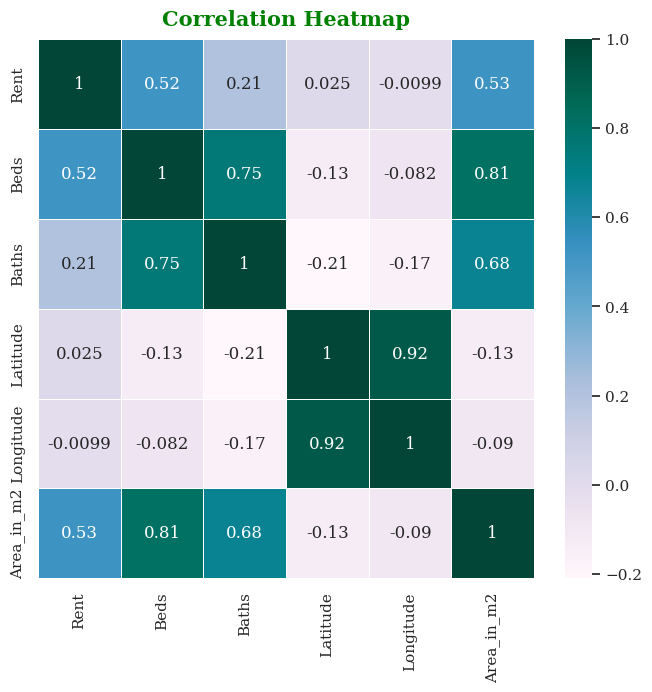

In [32]:
sns.set_theme(font = 'serif')
plt.figure(figsize=(8,7))
sns.heatmap(corr_matrix,annot=True,cmap='PuBuGn',linewidths=.5)
plt.title('Correlation Heatmap', fontdict={'fontweight': 'bold'}, fontsize=15, color='green',pad=10)
plt.show()

Các biến hiển thị giá trị dương có màu xanh lá hoặc xanh dương thể hiện mối quan hệ đồng biến giữa các cặp biến: khi biến này tăng thì biên kia cũng tăng. Các biến hiển thị giá trị âm có màu tím hoặc hồng nhạt thể hiện mối quan hệ nghịch biến giữa các cặp biến: khi biến này tăng thì biến kia giảm.

Vậy các dữ liệu tác động cùng chiều mạnh tới giá thuê nhà ở UAE là: Số phòng ngủ (Beds), Diên tích bất động sản (Area_in_m2) và Số phòng tắm (Baths).


# 3. TRỰC QUAN HÓA DỮ LIỆU

**Trực quan giá thuê thuê nhà**

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:632: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



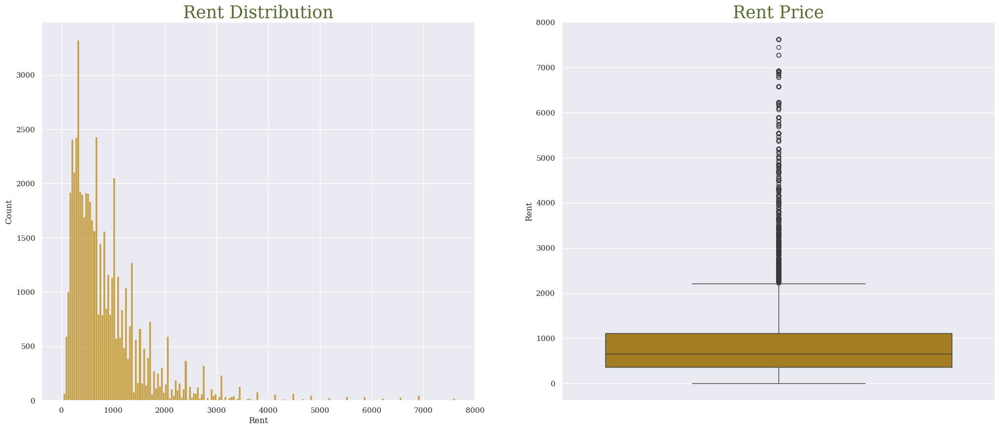

In [57]:
plt.rcParams['figure.figsize'] = (25, 10)
plt.rc('font', family='serif')
plt.subplot(1,2,1)
plt.title('Rent Distribution', fontsize=25, color='darkolivegreen')
sns.histplot(df.Rent, kde=False, color='darkgoldenrod')
plt.subplot(1,2,2)
plt.title('Rent Price', fontsize=25, color='darkolivegreen')
sns.boxplot(y=df.Rent, color='darkgoldenrod')
plt.show()

- Biểu đồ lệch trái chứng tỏ hầu hết các bất động thuê đều có giá tiền thấp.

- Có sự chênh lệch mạnh khi 90% xe có giá từ 1,7 tỷ VND trở xuống, 10% còn lại có giá thuê là trên 7,5 tỷ VND.


**Phân phối các biến**

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-

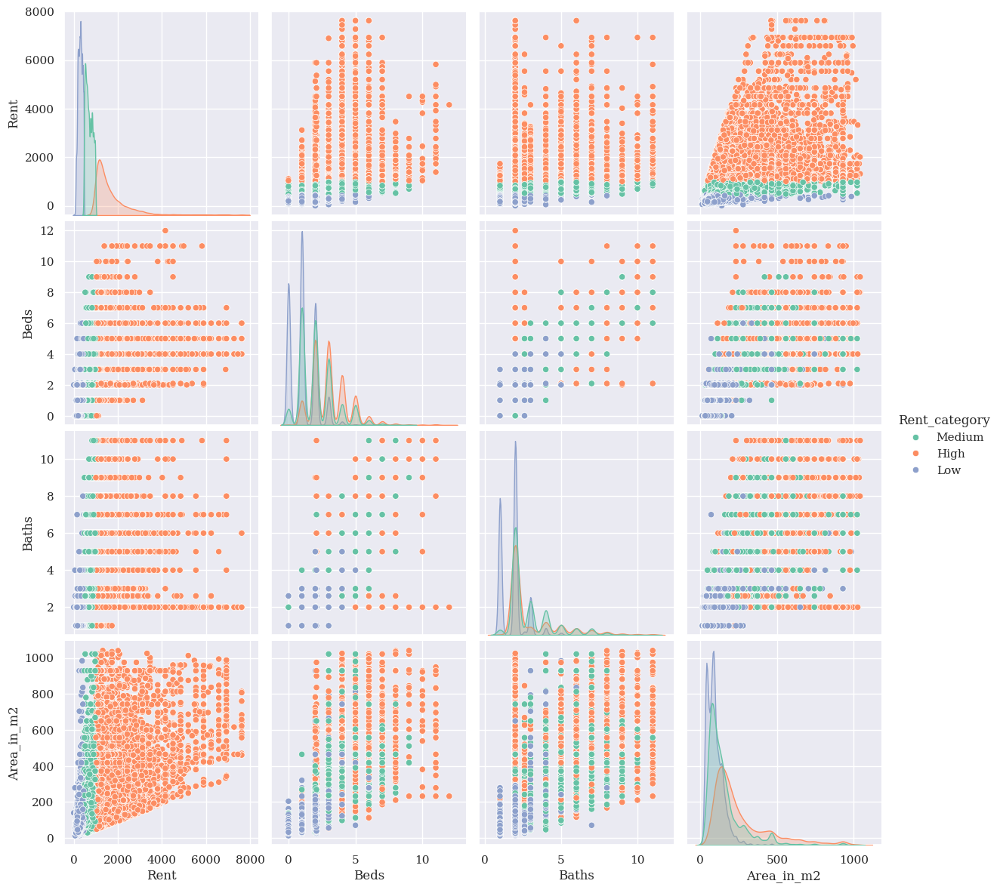

In [58]:
sns.set(style="whitegrid")
sns.set_theme(font = 'serif')

pairplot = sns.pairplot(df, vars=['Rent', 'Beds', 'Baths', 'Area_in_m2'],
                        hue='Rent_category',diag_kind="kde", markers="o",
                        height=3, aspect=1, kind="scatter",
                        palette="Set2")

plt.show()

Mối tương quan giữa giá và các biến khác:
- Biểu đồ phân tán giữa Rent và Area in m2 và Beds cho thấy mối tương quan tuyến tính dương mạnh giữa hai biến. Điều này có nghĩa là giá thuê nhà có xu hướng tăng mạnh khi diện tích và số phòng ngủ tăng, mức độ tương quan được thể hiện qua độ dốc cao của đường hồi quy trong biểu đồ.

- Biểu đồ phân tán giữa Rent và Baths cho thấy mối tương quan tuyến tính dương yếu giữa hai biến này. Điều này có nghĩa là giá thuê nhà có xu hướng tăng khi số phòng tắm tăng, nhưng mức độ tăng này không rõ ràng như đối với diện tích hay số phòng ngủ. Mức độ tương quan được thể hiện qua độ dốc thấp của đường hồi quy trong biểu đồ.

Phân bố dữ liệu các biến:
- Biểu đồ mật độ của Area in m2 cho thấy phân phối lệch trái tương tự như Rent

- Biểu đồ mật độ của Beds và Baths cho thấy phân phối đối xứng hơn, với số lượng căn nhà có số phòng ngủ và số phòng tắm khác nhau tương đối đồng đều.  

Nhìn chung, dữ liệu cho thấy rằng diện tích nhà là yếu tố có ảnh hưởng mạnh nhất đến giá thuê nhà, tiếp theo là số phòng ngủ và số phòng tắm. Phân bố dữ liệu cho thấy giá thuê nhà ở UAE có xu hướng tập trung ở mức thấp, với một số ít căn nhà có giá thuê rất cao và hầu như dữ số phòng ngủ, số nhà tắm và diện tích nhà ở đây đều tập trung ở mức thấp.


**Giá thuê nhà biến động theo thời gian**

In [59]:
df['Posted_date'] = pd.to_datetime(df['Posted_date'], dayfirst=True)
prices_month_mean = df[["Posted_date", "Rent"]].groupby("Posted_date")["Rent"].mean().reset_index()

fig = px.line(prices_month_mean, x='Posted_date', y="Rent", color_discrete_sequence=["darkolivegreen"], title="Giá Thuê Nhà Theo Thời Gian Đăng")
fig.update_layout(
    title_font=dict(family="serif", color="darkolivegreen"),
    xaxis_title="Ngày Đăng",
    yaxis_title="Giá Thuê Trung Bình (triệu VND)",
    font=dict(
        family="serif",
        size=14,
        color="darkolivegreen"
    )
)
fig.show()

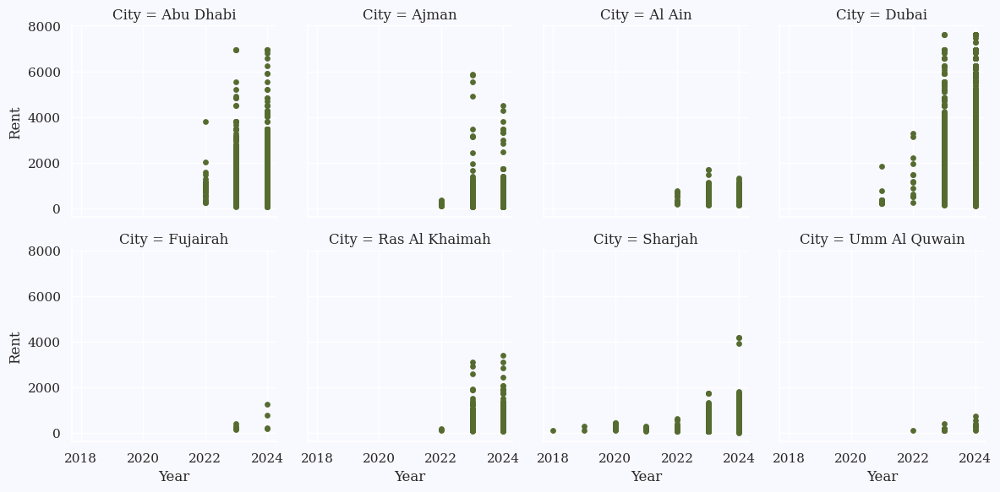

In [60]:
sns.set_theme(font = 'serif')
df['Year'] = df['Posted_date'].dt.year
g = sns.FacetGrid(df,col='City',col_wrap=4)
g.figure.patch.set_facecolor('ghostwhite')
for i in g.axes:
    i.set_facecolor('ghostwhite')
g.map(plt.scatter, 'Year', 'Rent',color="darkolivegreen", s=15)

Từ 2 biểu đồ ở trên, chúng ta có thể nhận thấy rằng trong thời gian gần đây, nhu cầu về bất động sản cho thuê đã tăng lên mạnh mẽ ở UAE. Sharjah đã có nhiều bất động sản cho thuê kể từ năm 2018, trong khi ở Thành phố khác, nhu cầu về Bất động sản cho thuê xuất hiện vào năm 2022 và danh sách bất động sản đó ngày càng tăng theo thời gian. Giá thuê nhà ở UAE đã tăng đáng kể trong 5 năm qua, với mức tăng trung bình là 27%.

**Biến động giá thuê theo thành phố**

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\3873357092.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a l

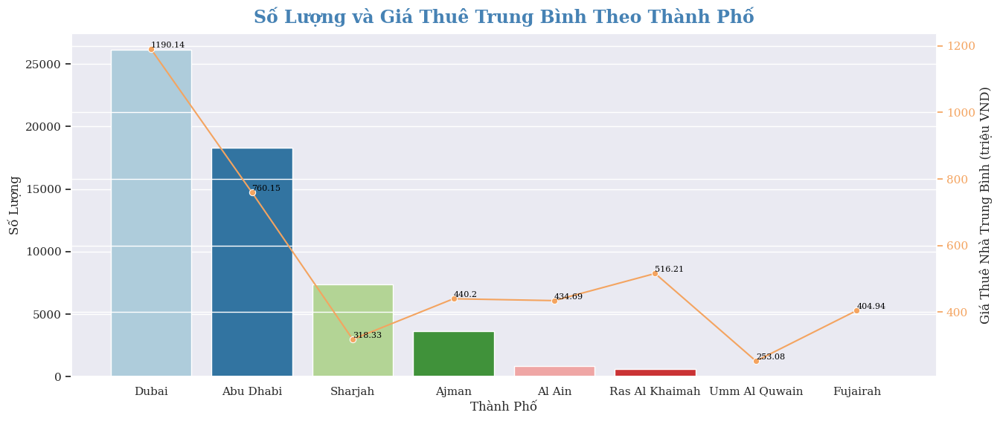

In [61]:
city_counts = df['City'].value_counts().reset_index()
city_counts.columns = ['City', 'Count']
avg_rent_by_city = df.groupby('City')['Rent'].mean().reset_index().sort_values(by='Rent', ascending=False)
merged_df = pd.merge(city_counts, avg_rent_by_city, on='City')

sns.set_theme(font = 'serif')
fig, ax1 = plt.subplots(figsize=(15, 6))
sns.barplot(data=merged_df, x='City', y='Count', ax=ax1, palette='Paired')
ax1.set_ylabel('Số Lượng')
ax1.set_xlabel('Thành Phố')
ax1.set_title('Số Lượng và Giá Thuê Trung Bình Theo Thành Phố',fontdict={'fontweight': 'bold'}, fontsize=17, color='steelblue',pad=10)
ax1.tick_params(axis='y')
ax1.set_xticklabels(ax1.get_xticklabels())
ax2 = ax1.twinx()
sns.lineplot(data=merged_df, x='City', y='Rent', ax=ax2, color='sandybrown', marker='o' )
ax2.set_ylabel('Giá Thuê Nhà Trung Bình (triệu VND)')
ax2.tick_params(axis='y',labelcolor='sandybrown',color='sandybrown')
for i, v in enumerate(merged_df['Rent']):
    plt.text(i, v+5, str(round(v, 2)), color='black', fontsize=8)

plt.show()

Dubai là một Thành phố rất nổi tiếng về du lịch vì thế số lượng bất động sản cho thuê ở đó cũng rất cao. 

Theo sau đó Abu Dhabi và Sharjah đứng ở vị trí nhiều thứ hai và thứ ba. Cuối cùng là Umm Al Quwain và FujairahFujairah có ít nhà cho thuê hơn vì ít được khách du lịch chú ý hơn.

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\3921208844.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




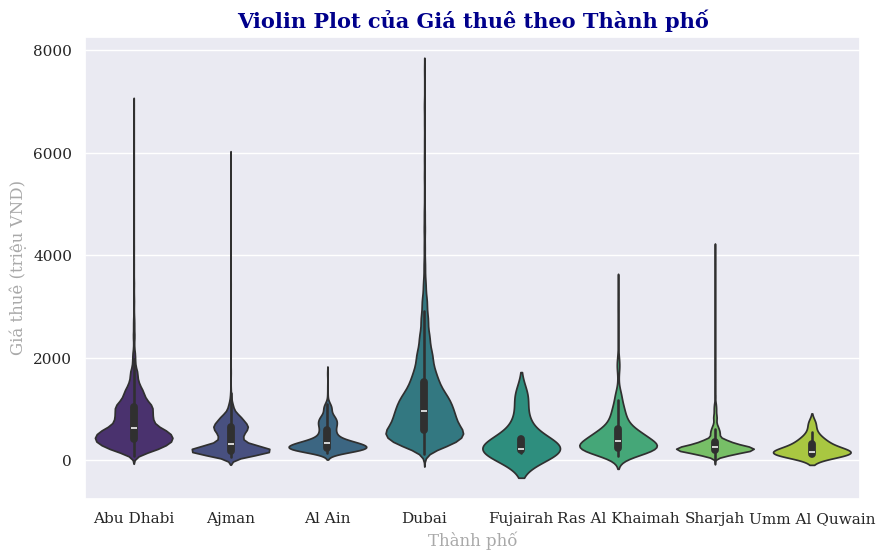

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\3921208844.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




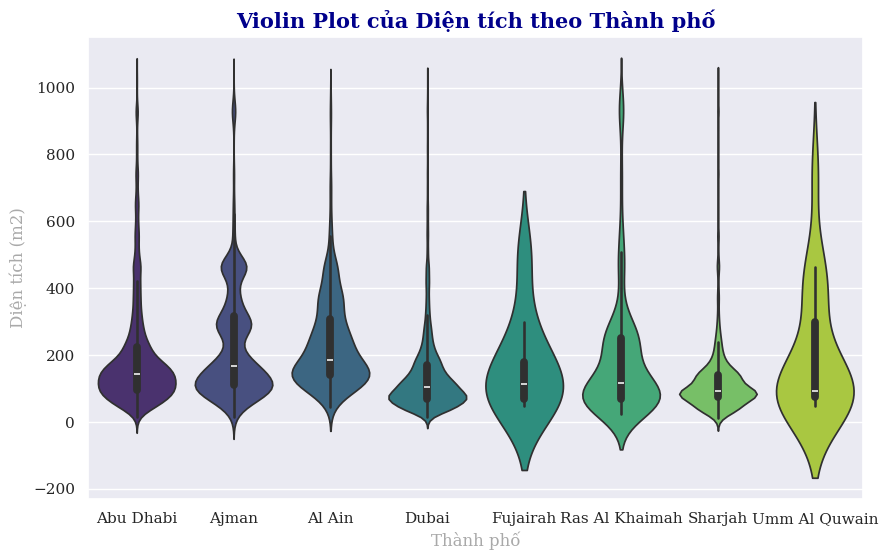

In [62]:
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='City', y='Rent', palette="viridis")  
plt.title('Violin Plot của Giá thuê theo Thành phố', fontsize=15, fontweight='bold', color='darkblue') 
plt.xlabel('Thành phố', fontsize=12, color='darkgray') 
plt.ylabel('Giá thuê (triệu VND)', fontsize=12, color='darkgray')  
plt.show()
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='City', y='Area_in_m2', palette="viridis")  
plt.title('Violin Plot của Diện tích theo Thành phố', fontsize=15, fontweight='bold', color='darkblue') 
plt.xlabel('Thành phố', fontsize=12, color='darkgray') 
plt.ylabel('Diện tích (m2)', fontsize=12, color='darkgray')  
plt.show()

Chỉ có 2 Thành phố có mức giá thuê nhà cao hơn mức thuê trung bình chung của UAE là Dubai và Abu Dhabi. Nguyên nhân vì chúng là những thành phố lớn nhất và phát triển nhất của Các Tiểu vương quốc Ả Rập Thống nhất, với nhiều khu dân cư cao cấp, tập trung nhiều trụ sở công ty lớn và tổ chức quốc tế.

Các thành phố còn lại có mức giá thuê nhà thấo hơn mức trung bình chung của UAE do chi phí sinh hoạt tại các thành phố này thấp hơn, đặc biệt là về giá nhà đất và các dịch vụ tiện ích, an sinh xã hội. 

Từ biểu đồ ở trên, chúng ta có thể nhận thấy rằng Dubai có Giá thuê trung bình cao nhất là 1 tỷ 180 triệu VND, nhưng diện tích trung bình mà thành phố này mang lại lại rất ít so với các Thành phố khác (142 m2). Abu Dhabi là Thành phố duy nhất có Giá thuê trung bình và Diện tích trung bình cao (giá thuê và diện tích trung bình lần lượt là 783 triệu VND và 205 m2). Trong khi Thành phố có Giá thuê nhà trung bình thấp nhất là Umm Al Quwain với Giá thuê trung bình là 295 triệu VND, nhưng những bất động sản ở đây cung cấp không gian cho thuê có diện tích cao để sinh hoạt. Và thành phố Al Ain có diện tích sinh hoạt trung bình rất cao (đứng thứ hai) với giá thuê rất thấp (thấp thứ 3).


**Biến động giá thuê theo địa điểm cụ thể**

In [63]:
avg_rent_per_location = df.groupby('Location')['Rent'].mean().reset_index()

fig_treemap = px.treemap(
    avg_rent_per_location, 
    path=['Location'], 
    values='Rent', 
    title='Giá Thuê Trung Bình Theo Địa Điểm Cụ Thể',
    width=1200,
    height=600  
)
fig_treemap.layout.font = dict(family='serif', size=12)

fig_treemap.show()

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\408318090.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a le

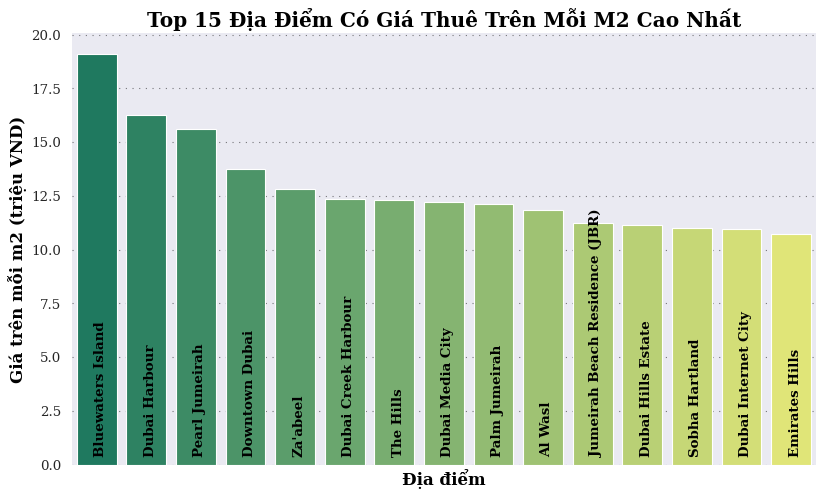

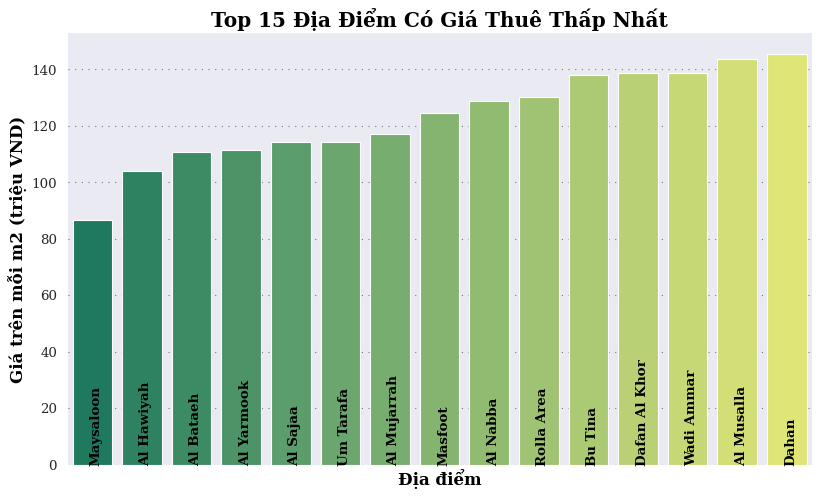

In [64]:
locations_rent = df.groupby('Location')['Rent_per_m2'].mean().sort_values(ascending=False).head(15).reset_index()
fig,ax = plt.subplots(figsize = (12,7),dpi = 80)
sns.barplot(data=locations_rent,x='Location',y='Rent_per_m2',palette='summer')
ax.grid(axis='y',linewidth=1,alpha=0.5,color='#000000',linestyle=':',dashes=(1,5))
plt.title('Top 15 Địa Điểm Có Giá Thuê Trên Mỗi M2 Cao Nhất',fontsize=18,c='#000000',fontweight='bold')
plt.xlabel('Địa điểm',c='#000000',fontsize=15,fontweight='bold')
plt.ylabel('Giá trên mỗi m2 (triệu VND)',c='#000000',fontsize=15,fontweight='bold')
plt.xticks([],rotation=90,fontsize=12)
plt.yticks(fontsize=12)
for i in ['left','top','right','bottom']:
    ax.spines[i].set_visible(False)
count = 0
for i in ax.patches:
    ax.text(i.get_x()+0.35,0.5,locations_rent['Location'][count],weight='bold',fontsize=12,color='black',rotation='vertical')
    count = count + 1
locations_rent = df.groupby('Location')['Rent'].mean().sort_values().head(15).reset_index()
fig,ax = plt.subplots(figsize = (12,7),dpi = 80)
sns.barplot(data=locations_rent,x='Location',y='Rent',palette='summer')
ax.grid(axis='y',linewidth=1,alpha=0.5,color='#000000',linestyle=':',dashes=(1,5))
plt.title('Top 15 Địa Điểm Có Giá Thuê Thấp Nhất',fontsize=18,c='#000000',fontweight='bold')
plt.xlabel('Địa điểm',c='#000000',fontsize=15,fontweight='bold')
plt.ylabel('Giá trên mỗi m2 (triệu VND)',c='#000000',fontsize=15,fontweight='bold')
plt.xticks([],rotation=90,fontsize=12)
plt.yticks(fontsize=12)
for i in ['left','top','right','bottom']:
    ax.spines[i].set_visible(False)
count = 0
for i in ax.patches:
    ax.text(i.get_x()+0.35,0.5,locations_rent['Location'][count],weight='bold',fontsize=12,color='black',rotation='vertical')
    count = count + 1

Giá thuê nhà ở UAE có sự chênh lệch đáng kể giữa các vị trí. Giá thuê cao nhất được ghi nhận tại khu vực Al Barari, The Lakes, Al Alia, Jumeirah Islands, The Meadows, Bluewaters Island, Jumeirah Golf Estates, Jumeirah Park, Culture Village, Al Mizhar, The Villa, Jumeirah, Arabian Ranches 2 và Al Jubail Island. Tại đây, giá thuê gần 2.5 tỷ VND/năm.

Giá thuê thấp nhất được ghi nhận tại khu vực Al Shary, M. Nabba, Al Mujarrah, Bu Tina, M. Nakhil, Rolla Area, Al Awir, Al Musalla, Al Seer, Al Rumaila, Garden City, Al Manakh, Al Bustan và Ajman Industrial, Industrial Area. Tại đây, giá thuê chỉ từ 75 triệu VND/năm.


In [65]:
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    width=900,
    height=400,
    hover_data=["Rent"],
    color="Rent",
    
    )
fig.update_layout(mapbox_style="open-street-map",
                  font=dict(family="serif"),)
fig.show()

Biểu đồ trực quan hóa vị trí các bất động sản được cho thuê thông qua kinh độ, vĩ độ giúp ta có thể dễ dàng tìm kiếm, so sánh và đưa ra quyết định. Bất động với giá thấp sẽ được biểu thị bằng chấm màu đậm, giá càng cao thì màu sẽ sáng dần sang màu vàng. 

**Biến động giá thuê theo loại hình bất động sản**

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\871982767.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a le

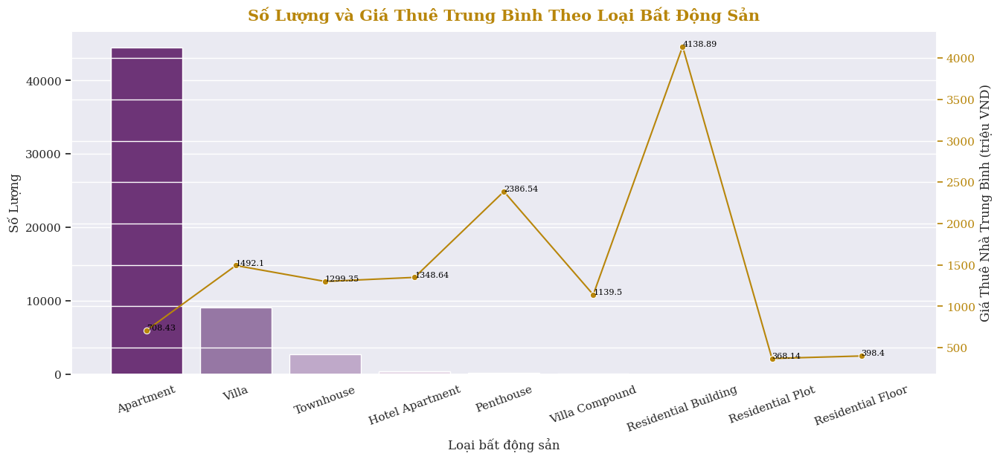

In [75]:
type_counts = df['Type'].value_counts().reset_index()
type_counts.columns = ['Type', 'Count']
avg_rent_by_type = df.groupby('Type')['Rent'].mean().reset_index().sort_values(by='Rent')
merged_df = pd.merge(type_counts, avg_rent_by_type, on='Type')

fig, ax1 = plt.subplots(figsize=(15,6))
sns.barplot(data=merged_df, x='Type', y='Count', ax=ax1, palette='PRGn')
ax1.set_ylabel('Số Lượng')
ax1.set_xlabel('Loại bất động sản')
ax1.set_title('Số Lượng và Giá Thuê Trung Bình Theo Loại Bất Động Sản',fontdict={'fontweight': 'bold'}, fontsize=15, color='darkgoldenrod',pad=10)
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=20)
ax2 = ax1.twinx()
sns.lineplot(data=merged_df, x='Type', y='Rent', ax=ax2, color='darkgoldenrod', marker='o' )
ax2.set_ylabel('Giá Thuê Nhà Trung Bình (triệu VND)')
ax2.tick_params(axis='y',labelcolor='darkgoldenrod',color='darkgoldenrod')
for i, v in enumerate(merged_df['Rent']):
    plt.text(i, v+5, str(round(v, 2)), color='black', fontsize=8)
plt.show()

Qua các đồ thị Bar trên ta thấy ở thị trường cho thuê bất động sản tại UAE các loại hình bất động sản được ưa chuộng xây dựng nhất là:
-  Căn hộ (Apartment): Phù hợp cho cá nhân, gia đình nhỏ, giá cạnh tranh, tiện nghi đầy đủ.
-  Biệt thự (Villa): Không gian rộng, sang trọng, riêng tư, tạo .
-  Nhà phố (Townhouse): Diện tích vừa phải, giá hợp lý, ít tiện nghi hơn căn hộ cao cấp, mật độ dân cư cao hơn biệt thự. 

Ngoài ra Residential building, Penthouse và Villa là những loại hình bất động sản có giá thuê trung bình cao nhất. Trong khi Residential floor và Apartment có giá thuê trung bình rất thấp.


**Biến Động Giá Theo Số Lượng Phòng Ngủ Và Phòng Tắm**

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\3547783585.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a l

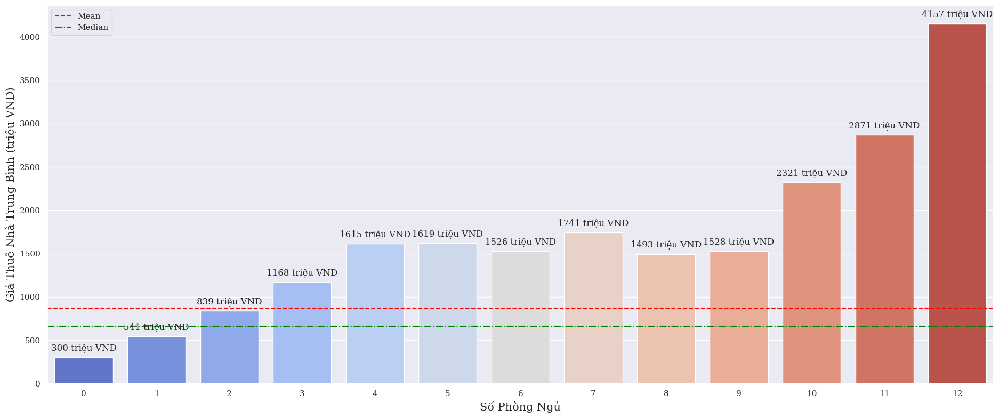

In [67]:
plt.figure(figsize=(19,8))
df["Beds_rounded"] = df["Beds"].astype(int)
avg_rent_by_bed = df.groupby('Beds_rounded')['Rent'].mean().reset_index()
avg_rent_by_bed['Beds'] = avg_rent_by_bed['Beds_rounded']
sns.barplot(data= avg_rent_by_bed, x='Beds', y='Rent', palette='coolwarm', errorbar=None)

mean_rent = df['Rent'].mean()
median_rent = df['Rent'].median()
plt.axhline(mean_rent, color='red', linestyle='--', label='Mean')
plt.axhline(median_rent, color='green', linestyle='-.', label='Median')
for i, rent in enumerate(avg_rent_by_bed ['Rent']):
    plt.text(i, rent+50, str(int(rent))+' triệu VND', ha='center', va='bottom', fontsize=12)

plt.xlabel('Số Phòng Ngủ', fontsize=15)
plt.ylabel('Giá Thuê Nhà Trung Bình (triệu VND)', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\2680479313.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a l

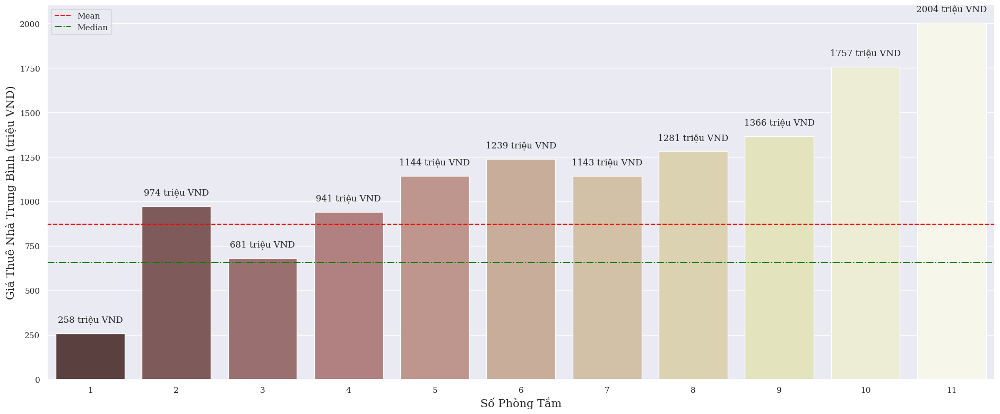

In [68]:
plt.figure(figsize=(19,8))
df["Baths_rounded"] = df["Baths"].astype(int)
avg_rent_by_bath = df.groupby('Baths_rounded')['Rent'].mean().reset_index()
avg_rent_by_bath['Baths'] = avg_rent_by_bath['Baths_rounded']
sns.barplot(data= avg_rent_by_bath, x='Baths', y='Rent', palette='pink', errorbar=None)

mean_rent = df['Rent'].mean()
median_rent = df['Rent'].median()
plt.axhline(mean_rent, color='red', linestyle='--', label='Mean')
plt.axhline(median_rent, color='green', linestyle='-.', label='Median')
for i, rent in enumerate(avg_rent_by_bath ['Rent']):
    plt.text(i, rent+50, str(int(rent))+' triệu VND', ha='center', va='bottom', fontsize=12)

plt.xlabel('Số Phòng Tắm', fontsize=15)
plt.ylabel('Giá Thuê Nhà Trung Bình (triệu VND)', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()

Các bất động sản ở UAE có xu hướng xây dựng từ 0- 5 phòng ngủ và từ 1- 4 phòng tắm, số bất động sản có từ 6 phòng ngủ trở hoặc từ 5 phòng ngủ trở lên lên chiếm tỷ lệ rất thấp. 

Đương nhiên bất động sản nào càng sở hữu nhiều phòng ngủ hoặc phòng tắm thì giá thuê sẽ càng cao (các bất động sản có 10 phòng ngủ và 11 phòng ngủ có giá thuê trung bình lần lượt là 2 tỷ 425 triệu VND và 2 tỷ 996 triệu VND; bất động sản sở hữu 10 và 11 phòng tắm có giá thuê trung bình lần lượt là 2 tỷ 121 triệu VND và 1 tỷ 995 triệu VND).


**Giá thuê nhà và phân khúc**

In [69]:
rent_min_max_category = df.groupby('Rent_category')[['Rent']].agg(['min', 'max'])
rent_min_max_category

Rent            
                      min         max
Rent_category                        
High           972.785268  7621.53700
Low              0.006929   450.36355
Medium         451.749284   970.01380

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\3662484518.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a l

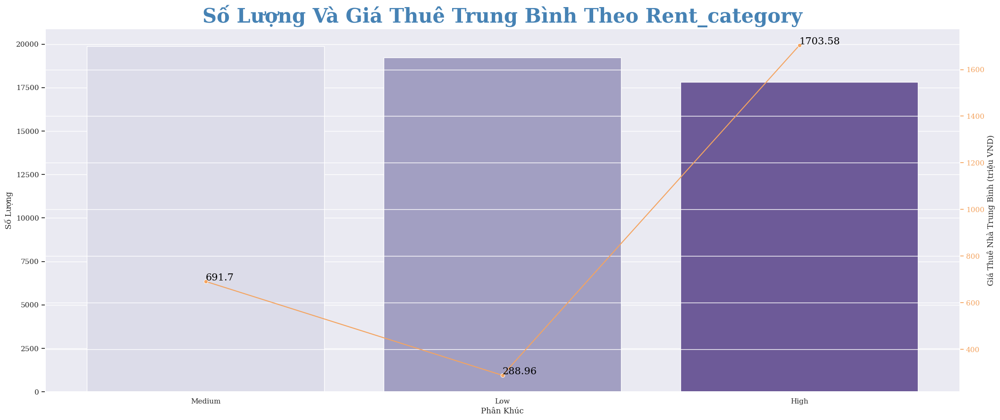

In [70]:
category_counts = df['Rent_category'].value_counts().reset_index()
category_counts.columns = ['Rent_category', 'Count']
avg_rent_by_furnishing = df.groupby('Rent_category')['Rent'].mean().reset_index().sort_values(by='Rent', ascending=False)
merged_df = pd.merge(category_counts, avg_rent_by_furnishing, on='Rent_category')
fig, ax1 = plt.subplots()
sns.barplot(data=merged_df, x='Rent_category', y='Count', ax=ax1, palette='Purples')
ax1.set_ylabel('Số Lượng')
ax1.set_xlabel('Phân Khúc')
ax1.set_title('Số Lượng Và Giá Thuê Trung Bình Theo Rent_category',fontdict={'fontweight': 'bold'}, color='steelblue',pad=10,  fontsize=30)
ax1.tick_params(axis='y')
ax1.set_xticklabels(ax1.get_xticklabels())
ax2 = ax1.twinx()
sns.lineplot(data=merged_df, x='Rent_category', y='Rent', ax=ax2, color='sandybrown', marker='o' )
ax2.set_ylabel('Giá Thuê Nhà Trung Bình (triệu VND)')
ax2.tick_params(axis='y',labelcolor='sandybrown',color='sandybrown')
for i, v in enumerate(merged_df['Rent']):
    plt.text(i, v+5, str(round(v, 2)), color='black', fontsize=15)
plt.show()

Qua biểu đồ trên, bất động sản được ưa chuộng trong việc cho thuê nhất là phân khúc Trung bình với gần 2000 bất động sản sau đó tới phân khúc thấp và ít nhất là phân khúc giá thuê cao. 

Điều này dễ dàng giải thích được khi mức giá trung bình của phân khúc Medium khá hợp lí với 6922 triệu đồng/ năm sẽ được hưởng những tiện ích mà phân khúc Low không có mà mức giá của phân khúc High quá cao không phù hợp với thu nhập của đa số người dân. 


**Biến Động Giá Theo Tình Hình Trang Trí Nội Thất**

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\2064108531.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Roaming\Python\Python311\site-packages\seaborn\_base.py:948: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\MICROSOFT\AppData\Local\Temp\ipykernel_14944\2064108531.py:11: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ti

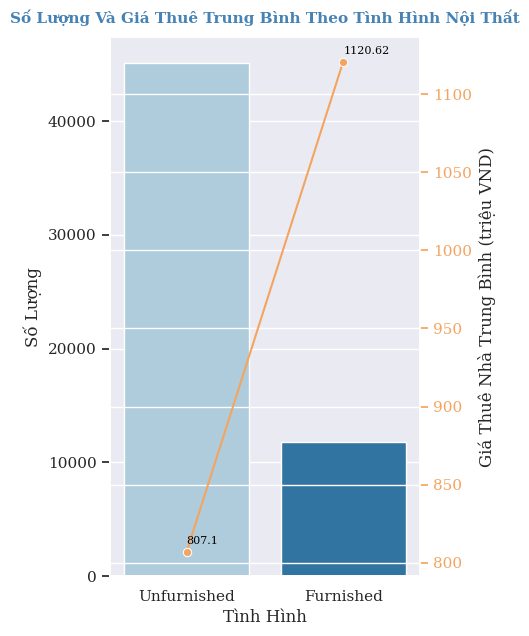

In [71]:
furnishing_counts = df['Furnishing'].value_counts().reset_index()
furnishing_counts.columns = ['Furnishing', 'Count']
avg_rent_by_furnishing = df.groupby('Furnishing')['Rent'].mean().reset_index().sort_values(by='Rent', ascending=False)
merged_df = pd.merge(furnishing_counts, avg_rent_by_furnishing, on='Furnishing')
fig, ax1 = plt.subplots(figsize=(4, 7))
sns.barplot(data=merged_df, x='Furnishing', y='Count', ax=ax1, palette='Paired')
ax1.set_ylabel('Số Lượng')
ax1.set_xlabel('Tình Hình')
ax1.set_title('Số Lượng Và Giá Thuê Trung Bình Theo Tình Hình Nội Thất',fontdict={'fontweight': 'bold'}, fontsize=10, color='steelblue',pad=10, size=11)
ax1.tick_params(axis='y')
ax1.set_xticklabels(ax1.get_xticklabels())
ax2 = ax1.twinx()
sns.lineplot(data=merged_df, x='Furnishing', y='Rent', ax=ax2, color='sandybrown', marker='o' )
ax2.set_ylabel('Giá Thuê Nhà Trung Bình (triệu VND)')
ax2.tick_params(axis='y',labelcolor='sandybrown',color='sandybrown')
for i, v in enumerate(merged_df['Rent']):
    plt.text(i, v+5, str(round(v, 2)), color='black', fontsize=8)
plt.show()

Số bất động sản chưa được trang bị nội thất chiếm phần lớn với tỷ lệ 79,51% trong tổng số bất động sản được đăng cho thuê tại UAE.

Với mức giá thuê theo năm trung bình hơn 1,1 tỷ VND những bất động được trang bị nội thất sẵn có sự chênh lệch khoảng 200 triệu VND hơn so với những bất động sản không được trang bị.


In [72]:
temp = df.groupby(['Furnishing','Rent_category'])['Rent_category'].count().to_frame().rename(columns={'Rent_category':'count'}).reset_index()
fig = px.sunburst(temp, path=['Furnishing', 'Rent_category'], values='count',color='Rent_category',color_discrete_map={'(?)':'#fff0f5','Low':'#ff69b4','Medium':'#FFC0CB','High':'#ffe4e1'})
fig.update_layout(title={
        'text':''},
        font=dict(size=15, color='black'),
        margin=dict(l=0, r=80, t=55, b=10),
        plot_bgcolor='#ffe6e6')
fig.update_traces(textinfo="label+value")
fig.update_layout(font=dict( family="serif",size=14))

Rất nhiều bất động sản không được trang bị nội thất được cho thuê với giá Thấp theo sau là giá thuê Trung bình  và ít nhất là giá Cao. 

Các bất động sản được trang bị nội thất hơn được liệt kê thường có giá thuê là Trung bình và Cao  trong khi rất ít trong số chúng thuộc danh mục giá thuê Thấp.


**Biến Động Giá Theo Diện Tích**

In [73]:
rent_min_max = df.groupby('Rent_category')[['Area_in_m2']].agg(['min', 'max']).reset_index()
rent_min_max

Rent_category Area_in_m2             
                       min          max
0          High  47.008938  1041.443078
1           Low  13.006426   983.843194
2        Medium  27.592203  1021.933440

In [74]:
fig = px.scatter(df, x='Area_in_m2', y='Rent', color= "Rent", title='Giá Thuê Nhà Và Diện Tích')
fig.update_layout(
    title_font=dict(family="serif",color="darkorchid"),
    xaxis_title="Diện tích (m2)",
    yaxis_title="Giá Thuê (triệu VND)",
    font=dict(
        family="serif",
        size=14,
        color="darkorchid"),
    title_x=0.5,
    margin=dict(t=37))
fig.show()

Trên thị trường bất động sản, diện tích là một trong những yếu tố quan trọng nhất quyết định giá thuê nhà. Diện tích càng lớn, không gian sống càng rộng rãi, thoải mái, đáp ứng nhu cầu sinh hoạt và nghỉ ngơi của nhiều người hơn, đồng thời thể hiện đẳng cấp và tiềm lực tài chính của người thuê. Do vậy, giá thuê nhà cũng sẽ tỷ lệ thuận với diện tích.

# 4. Conclusion

Dựa trên phân tích về bộ dữ liệu về giá nhà cho thuê tại UAE, có thể đưa ra một số kết luận sau:
- Bất động sản cho thuê ở phân khúc giá rẻ được ưa chuộn nhiều nhất, sau đó là giá trung bình và cao.
- Các yếu tố tỷ lệ thuận với giá nhà nhiều nhất là diện tích, số phòng ngủ và số phòng tắm: số lượng càng tăng giá nhà càng tăng cao.
- Các bất động sản được trang bị nội thất hơn được liệt kê thường có giá thuê là Trung bình và Cao  trong khi rất ít trong số chúng thuộc danh mục giá thuê Thấp, trong khi bất động sản chưa được trang bị nội thất thì trái ngược hoàn toàn.
- Các thành phố hiện đại với nhịp sống nhanh như Dubai, Abu Dhabi và Sharjah sẽ phổ biên dịch vụ thuê nhà nhiều hơn.
- Các loại hình  bất động sản được cho thuê nhiều nhất là Apartment, Villa, Town House với tiện nghi cung cấp đầy đủ và phù hợp với nhiều phân khúc khách hàng.

Với nguồn cung hạn chế và nhu cầu ngày càng tăng, giá thuê nhà tại UAE được dự báo sẽ tiếp tục xu hướng tăng trong tương lai gần. Điều này đòi hỏi những người có nhu cầu thuê nhà cần cân nhắc kỹ lưỡng các yếu tố như vị trí, loại hình bất động sản, diện tích, tiện nghi và mức giá trước khi đưa ra quyết định, đồng thời tìm hiểu kỹ thông tin thị trường để lựa chọn được căn nhà phù hợp với nhu cầu và khả năng tài chính của mình.

Nhìn chung, sự phát triển năng động của thị trường cho thuê bất động sản tại UAE không chỉ đáp ứng nhu cầu về nhà ở và không gian làm việc chất lượng cao, mà còn mang lại cơ hội đầu tư hấp dẫn cho các nhà đầu tư trong và ngoài nước. Với nền tảng kinh tế vững chắc, cơ sở hạ tầng hiện đại và sự hỗ trợ của chính phủ, thị trường này hứa hẹn sẽ tiếp tục phát triển mạnh mẽ và đóng vai trò quan trọng trong sự tăng trưởng kinh tế của UAE trong những năm sắp tới.
